Color calibration  Flora, 2020.9.3

https://plantcv.readthedocs.io/en/latest/installation/

https://plantcv.readthedocs.io/en/latest/transform_correct_color/



# Need enviroment : 
1. Install plantcv according to the link above:

For example:
conda install plantcv

2. activate plantv:
conda activate plantcv

Conditions:
To run color correction on an image, the following are needed:
Target and source images must contain a reference from which color values are sampled. The following example uses a 24-color Colorchecker passport.
A target image (RGB) must be chosen. This image will be of the color profile to which other images will be corrected.
A source image (RGB), that will be corrected to the target image's color profile
A mask (gray-scale) of the target image in which background has value 0, and color chips from the colorchecker are labeled with unique values greater than zero, but less than 255.
A mask (gray-scale) of the source image labeled consistently with the target image's mask.

There are a few important assumptions that must be met in order to automatically detect color cards:
- There is only one color card in the image.
- Color card should be 4x6 (like an X-Rite ColorChecker Passport Photo). Spacing calculations are based on 4x6 color cards. Although starting coordinates will be robust for most color cards, unless an entire row or entire column of chips is missing. Missing chips may also skew spacing and can also skew starting coordinates. 
- Color card isn't tilted. The card can be vertical OR horizontal but if it is tilted there will errors in calculating spacing.

In [1]:
from plantcv import plantcv as pcv
import cv2
import matplotlib. pyplot as plt

In [2]:
class options:
    def __init__(self):
        self.debug = "plot"
        self.writeimg= False
        self.result = "./color_tutorial_results"
        self.outdir = "."
        
# Get options
args = options()

# Set debug to the global parameter 
pcv.params.debug = args.debug

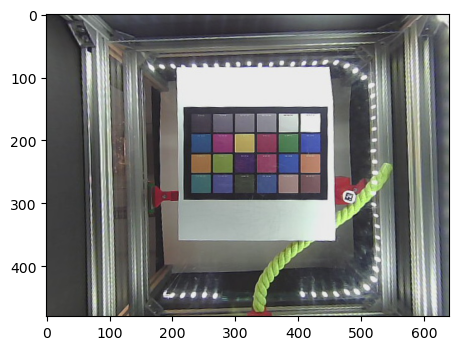

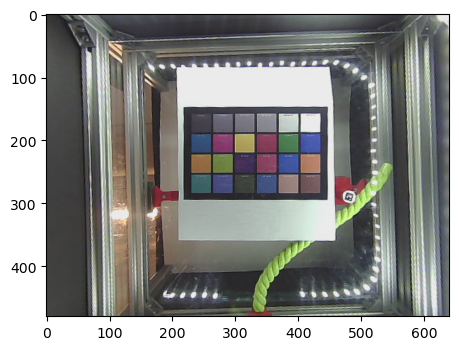

In [3]:
target_img, t_path, t_filename = pcv.readimage(filename="./images/undistorted-30-1.jpg")
source_img, s_path, s_filename = pcv.readimage(filename="./images/undistorted-25-1.jpg")

In [8]:
# some checking, this can be skipped

In [4]:
target_img.shape

(480, 640, 3)

In [5]:
target_img[200][200]

array([125, 134, 138], dtype=uint8)

In [6]:
source_img[200][200]

array([127, 137, 144], dtype=uint8)

In [9]:
# prepare for getting mask for the two images
dataframe1, start1, space1 = pcv.transform.find_color_card(rgb_img=target_img, background='light')
dataframe2, start2, space2 = pcv.transform.find_color_card(rgb_img=source_img, background='light')

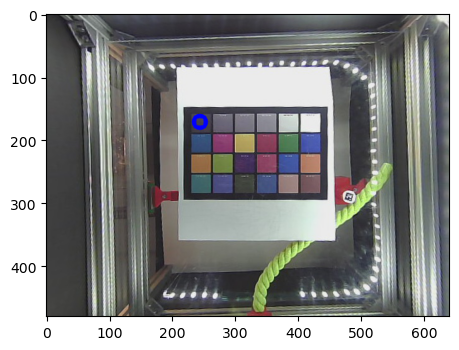

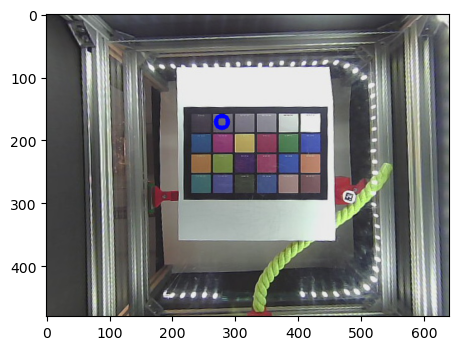

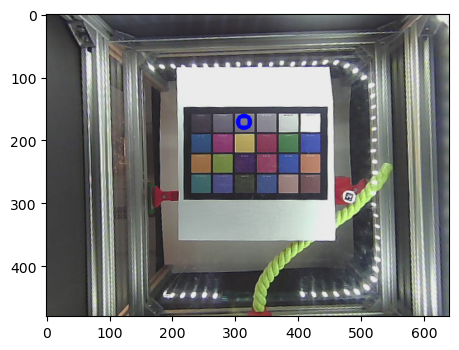

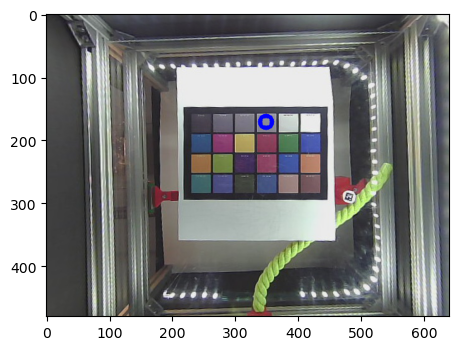

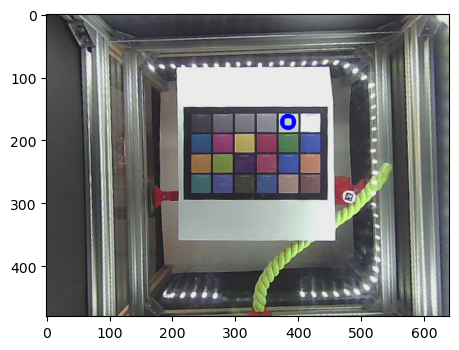

...

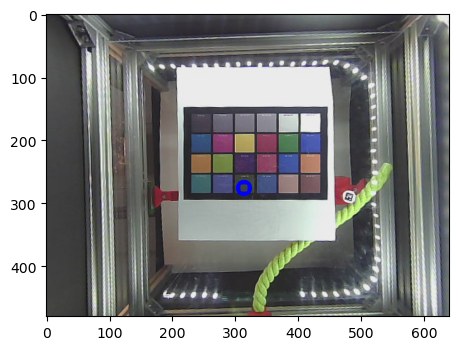

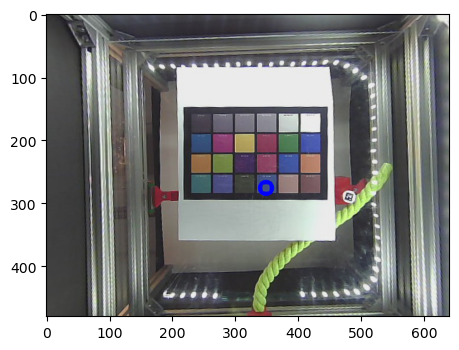

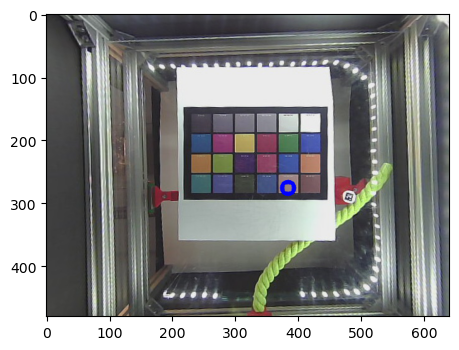

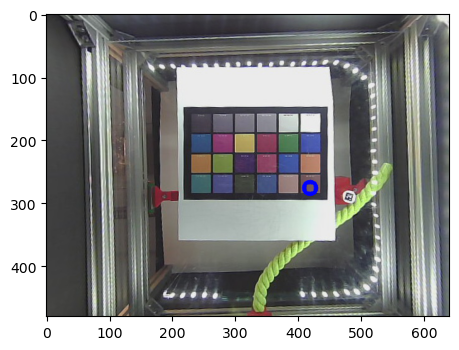

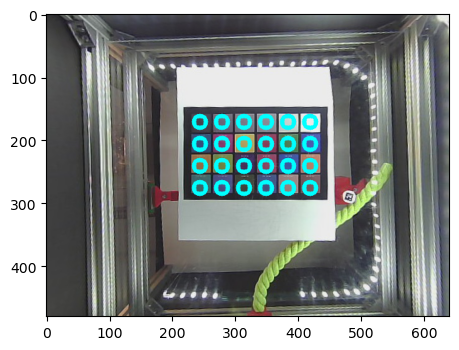

In [10]:
target_mask = pcv.transform.create_color_card_mask(target_img, radius=10, start_coord=start1, 
                                                   spacing=space1, nrows=4, ncols=6)



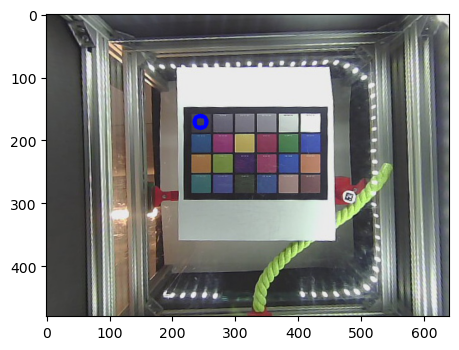

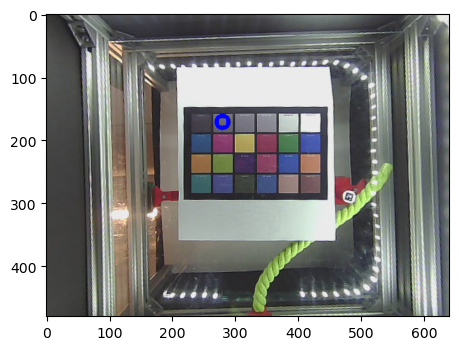

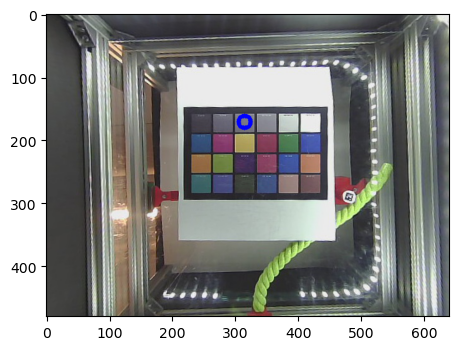

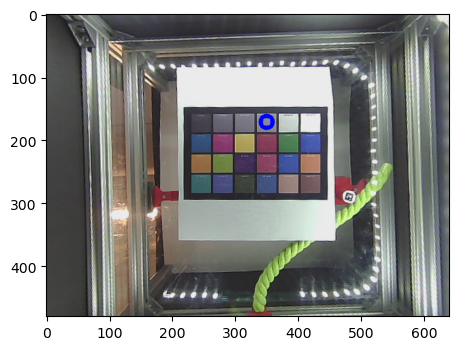

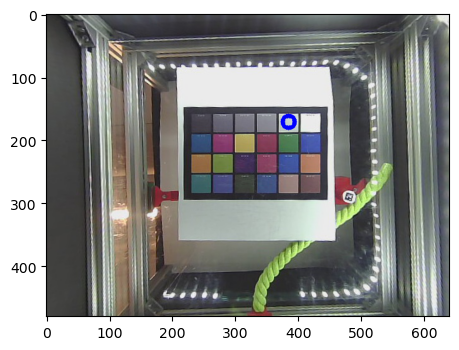

...

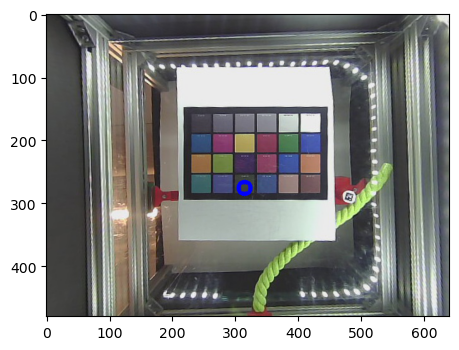

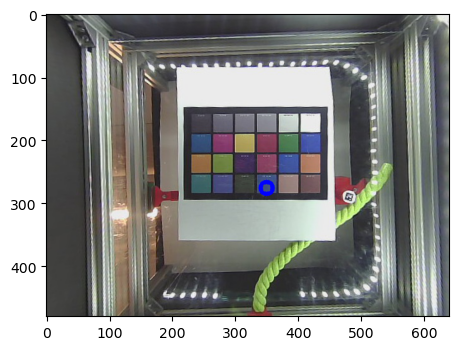

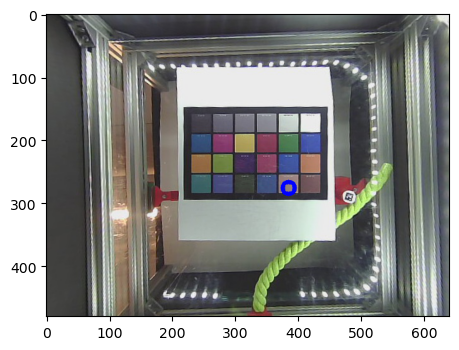

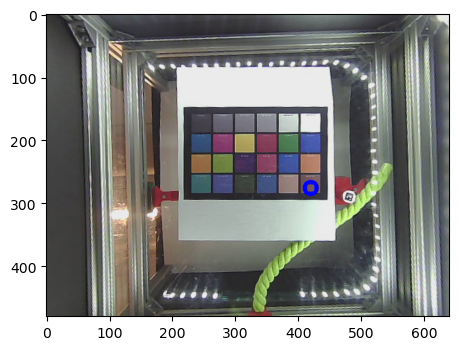

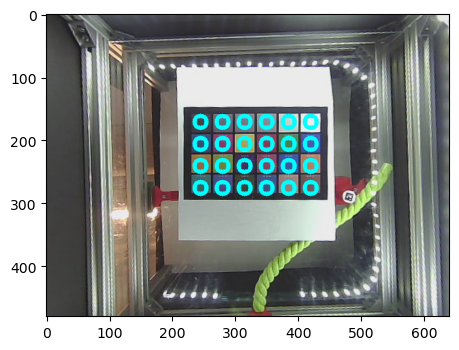

In [11]:
source_mask = pcv.transform.create_color_card_mask(source_img, radius=10, start_coord=start2, 
                                                   spacing=space2, nrows=4, ncols=6)

In [12]:
cv2.imwrite("target_img.png",target_img)
cv2.imwrite("target_mask.png",target_mask)
cv2.imwrite("source_img.png",source_img )
cv2.imwrite("source_mask.png",source_mask)

True

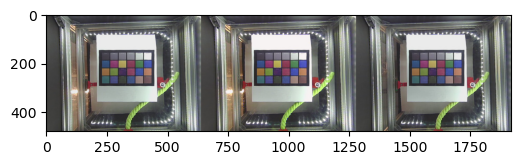

In [13]:
tm, sm, transformation_matrix, corrected_img = pcv.transform.correct_color(target_img=target_img, 
                                                                           target_mask=target_mask, 
                                                                           source_img=source_img, 
                                                                           source_mask=source_mask, 
                                                                           output_directory=args.outdir)



array([253,   4,   5], dtype=uint8)

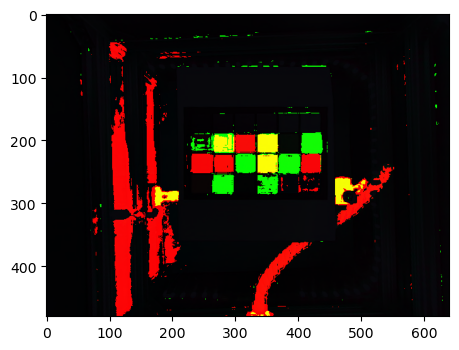

In [14]:
diff = abs(corrected_img - source_img)
plt.imshow(diff)
diff[200][120]

In [13]:
t_img = cv2.imread("target_img.png")
t_mask = cv2.imread("target_mask.png", -1) # mask must be read in "as-is" include -1

s_img = cv2.imread("source_img.png")
s_mask = cv2.imread("source_mask.png", -1)

headers1, target_matrix = pcv.transform.get_color_matrix(t_img, t_mask)
headers2, source_matrix = pcv.transform.get_color_matrix(s_img, s_mask)

print(headers1)
print(target_matrix)
print(headers2)
print(source_matrix)

['chip_number', 'r_avg', 'g_avg', 'b_avg']
[[ 10.         120.05641749  93.36671368  82.23836389]
 [ 20.         199.68265162 158.49083216 152.49083216]
 [ 30.         113.48377997 127.44287729 164.42172073]
 [ 40.         111.99294781 122.99294781  81.03526093]
 [ 50.         143.0832158  137.47672779 178.77997179]
 [ 60.         145.48377997 195.48377997 192.48660085]
 [ 70.         210.95204513 142.08603667  73.02820874]
 [ 80.          92.44569817  95.25952045 176.33427362]
 [ 90.         181.22425952 100.22566996 109.23695346]
 [100.          96.84344147  71.63328632 103.50493653]
 [110.         183.15232722 206.65021157  93.84344147]
 [120.         223.76586742 183.71368124  62.74471086]
 [130.          60.33145275  66.31734838 152.23131171]
 [140.         111.18758815 159.23131171 101.20028209]
 [150.         170.28490832  81.11283498  67.25246827]
 [160.         244.34696756 231.22708039  57.29196051]
 [170.         184.69957687 102.31875882 150.59379408]
 [180.          88.524

In [36]:
matrix_a, matrix_m, matrix_b = pcv.transform.get_matrix_m(target_matrix, source_matrix)

print("Moore-Penrose Inverse Matrix: ")
print(matrix_m)
print(matrix_b)

Moore-Penrose Inverse Matrix: 
[[ 8.28204866e-03  3.29830488e-03  1.88273085e-02 -2.36605800e-02
   1.75978653e-02  3.81274380e-02 -1.76648946e-02  1.77299185e-02
  -3.59666818e-02  9.11253937e-02 -6.03678578e-02  3.84977170e-02
  -3.78005986e-02  2.63301538e-03 -2.44134885e-03  2.26567200e-02
  -1.61444055e-02 -4.54506440e-02 -9.01717413e-03 -6.04063177e-03
   1.13804014e-02  2.57888591e-03 -4.81237034e-03 -9.12683546e-03]
 [ 1.21916673e-02 -2.29525284e-02  7.19508692e-03  4.61876645e-02
   3.53173898e-03 -3.96565456e-02  9.49021186e-03  6.62382052e-03
   2.69128825e-02 -1.13814951e-01  3.89229671e-02 -5.36034303e-02
  -1.36611734e-03 -1.49376704e-02  2.43078617e-02  8.40779926e-03
   2.11630086e-02  6.05637315e-02  2.21890945e-02 -3.31578089e-02
  -1.41207220e-02  6.66723843e-03  8.34663033e-03 -9.33226559e-03]
 [-1.26602978e-02  1.11714797e-02 -2.43527246e-02 -1.49953721e-02
  -2.08935629e-02 -3.80644944e-04  9.31529413e-03 -2.03906242e-02
   6.19341820e-03  2.73288349e-02  1.356534

In [38]:
deviance, transformation_matrix = pcv.transform.calc_transformation_matrix(matrix_m, matrix_b)
print(transformation_matrix)
print(deviance)

[[ 8.26055530e-01  3.67182390e-02 -4.83282612e-01  1.60588134e+01
   4.96775522e+00 -1.48068959e+02  9.96380577e+03 -1.67716653e+03
  -4.78521117e+04]
 [ 2.80868982e-01  9.58100839e-01  6.52053523e-01 -9.81630916e-02
   1.62897965e+01  3.08005685e+02 -7.45091137e+03  9.08617664e+03
   1.11594722e+05]
 [-2.73419776e-02  3.57208365e-03  8.45639819e-01 -1.47181779e+01
  -1.55751355e+01 -7.80831635e+01 -2.57093144e+03 -4.91999079e+03
  -3.22401418e+04]
 [ 4.13323190e-04  1.83424288e-04 -2.43343622e-04  1.43818518e-01
   1.20434804e-01  1.06105491e+00  2.50707350e+01  2.73000135e+01
   1.21490004e+02]
 [-1.34399342e-03  5.84301662e-05 -5.51056127e-03  6.74314872e-02
   8.15551830e-01 -2.53949329e+00  4.24233485e+01 -7.81692271e+01
  -9.11168811e+02]
 [ 8.75117152e-04 -3.91440469e-04  3.55554926e-03  9.12342688e-01
  -4.75288881e-02  9.89016918e-01 -7.07298491e+01  1.20307365e+01
   3.10072261e+02]
 [-1.11549173e-06 -6.11852403e-07  2.44931327e-06 -3.28187237e-04
  -2.29067434e-04  1.8375793

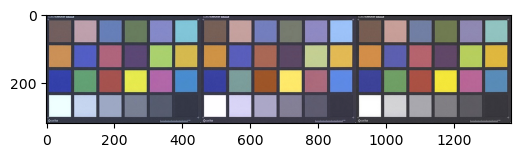

In [16]:
pcv.params.debug = "plot"

corrected_img = pcv.transform.apply_transformation_matrix(source_img=s_img, target_img=t_img, transformation_matrix=transformation_matrix)


In [ ]:
# If needed, you can save and load matrices.

# Inputs:
#   matrix - A numpy.matrix or numpy.ndarray
#   filename - Name of a file to which matrix will be saved. Must
#              end in .npz
pcv.transform.save_matrix(matrix=tm, filename='target_matrix.npz')

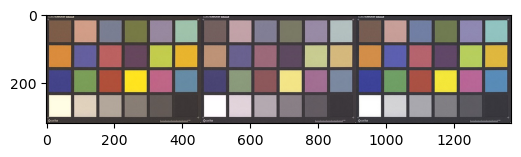

In [27]:
pcv.params.debug = 'plot'
tm, sm, transformation_matrix, corrected_img = pcv.transform.correct_color(target_img=target_img, 
                                                                           target_mask=target_mask, 
                                                                           source_img=source_img, 
                                                                           source_mask=source_mask, 
                                                                           output_directory=args.outdir)

